# Machine Failure - Study 1

https://machinelearningmastery.com/how-to-develop-a-probabilistic-forecasting-model-to-predict-air-pollution-days/

https://www.kaggle.com/binaicrai/machine-failure-data

https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/

https://machinelearningmastery.com/threshold-moving-for-imbalanced-classification/

https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-imbalanced-classification/

## 1 Load libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from umap import UMAP
import plotly.express as px
from sklearn.metrics import brier_score_loss
from numpy import loadtxt
from numpy import mean
from matplotlib import pyplot
from sklearn.base import clone
from sklearn.metrics import brier_score_loss
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc

## 2 Explore data

In [2]:
df = pd.read_csv('machine_failure_data.csv')
df.head()

,Date,Location,Min_Temp,Max_Temp,Leakage,Evaporation,Electricity,Parameter1_Dir,Parameter1_Speed,Parameter2_9am,Parameter2_3pm,Parameter3_9am,Parameter3_3pm,Parameter4_9am,Parameter4_3pm,Parameter5_9am,Parameter5_3pm,Parameter6_9am,Parameter6_3pm,Parameter7_9am,Parameter7_3pm,Failure_today,RISK_MM,Fail_tomorrow
0,2008-12-01,3,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,3,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,3,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,3,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,3,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 24 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Date              142193 non-null  object 
 1   Location          142193 non-null  int64  
 2   Min_Temp          141556 non-null  float64
 3   Max_Temp          141871 non-null  float64
 4   Leakage           140787 non-null  float64
 5   Evaporation       81350 non-null   float64
 6   Electricity       74377 non-null   float64
 7   Parameter1_Dir    132863 non-null  object 
 8   Parameter1_Speed  132923 non-null  float64
 9   Parameter2_9am    132180 non-null  object 
 10  Parameter2_3pm    138415 non-null  object 
 11  Parameter3_9am    140845 non-null  float64
 12  Parameter3_3pm    139563 non-null  float64
 13  Parameter4_9am    140419 non-null  float64
 14  Parameter4_3pm    138583 non-null  float64
 15  Parameter5_9am    128179 non-null  float64
 16  Parameter5_3pm    12

In [4]:
df.describe()

,Location,Min_Temp,Max_Temp,Leakage,Evaporation,Electricity,Parameter1_Speed,Parameter3_9am,Parameter3_3pm,Parameter4_9am,Parameter4_3pm,Parameter5_9am,Parameter5_3pm,Parameter6_9am,Parameter6_3pm,Parameter7_9am,Parameter7_3pm,RISK_MM
count,142193.000000,141556.000000,141871.000000,140787.000000,81350.000000,74377.000000,132923.000000,140845.000000,139563.000000,140419.000000,138583.000000,128179.000000,128212.000000,88536.000000,85099.000000,141289.000000,139467.000000,142193.000000
mean,24.740655,12.186400,23.226784,2.349974,5.469824,7.624853,39.984292,14.001988,18.637576,68.843810,51.482606,1017.653758,1015.258204,4.437189,4.503167,16.987509,21.687235,2.360682
std,14.237503,6.403283,7.117618,8.465173,4.188537,3.781525,13.588801,8.893337,8.803345,19.051293,20.797772,7.105476,7.036677,2.887016,2.720633,6.492838,6.937594,8.477969
min,1.000000,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000,0.000000
25%,12.000000,7.600000,17.900000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.900000,1010.400000,1.000000,2.000000,12.300000,16.600000,0.000000
50%,25.000000,12.000000,22.600000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000,0.000000
75%,37.000000,16.800000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000,0.800000
max,49.000000,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000,371.000000


## 3 Clean data

- Replace nans with zeros
- Convert target variables to numbers
- Drop categorical, date and fail today fields
- Make all numerical

In [5]:
def clean_data(df):
  # Drop categorical & date fields
  df = df.drop(columns=['Date', 'Parameter1_Dir','Parameter2_9am','Parameter2_3pm','Failure_today','RISK_MM'])
  # Convert target variables to numbers
  df['Fail_tomorrow'] = df['Fail_tomorrow'].replace({'Yes': '1', 'No':'0'})
  # Replace nans with zeros
  df = df.fillna(0)
  # Make call columns numerical
  df = df.astype(float)
  return df

df = clean_data(df)
df.head()

,Location,Min_Temp,Max_Temp,Leakage,Evaporation,Electricity,Parameter1_Speed,Parameter3_9am,Parameter3_3pm,Parameter4_9am,Parameter4_3pm,Parameter5_9am,Parameter5_3pm,Parameter6_9am,Parameter6_3pm,Parameter7_9am,Parameter7_3pm,Fail_tomorrow
0,3.0,13.4,22.9,0.6,0.0,0.0,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,0.0,16.9,21.8,0.0
1,3.0,7.4,25.1,0.0,0.0,0.0,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,0.0,0.0,17.2,24.3,0.0
2,3.0,12.9,25.7,0.0,0.0,0.0,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,0.0,2.0,21.0,23.2,0.0
3,3.0,9.2,28.0,0.0,0.0,0.0,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,0.0,0.0,18.1,26.5,0.0
4,3.0,17.5,32.3,1.0,0.0,0.0,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Location          142193 non-null  float64
 1   Min_Temp          142193 non-null  float64
 2   Max_Temp          142193 non-null  float64
 3   Leakage           142193 non-null  float64
 4   Evaporation       142193 non-null  float64
 5   Electricity       142193 non-null  float64
 6   Parameter1_Speed  142193 non-null  float64
 7   Parameter3_9am    142193 non-null  float64
 8   Parameter3_3pm    142193 non-null  float64
 9   Parameter4_9am    142193 non-null  float64
 10  Parameter4_3pm    142193 non-null  float64
 11  Parameter5_9am    142193 non-null  float64
 12  Parameter5_3pm    142193 non-null  float64
 13  Parameter6_9am    142193 non-null  float64
 14  Parameter6_3pm    142193 non-null  float64
 15  Parameter7_9am    142193 non-null  float64
 16  Parameter7_3pm    14

In [7]:
df.shape

(142193, 18)

In [8]:
df['Fail_tomorrow'].value_counts()

0.0    110316
1.0     31877
Name: Fail_tomorrow, dtype: int64

## 4 Data analysis
### 4.1 Univariate analysis

In [9]:
# Split dataset into fail/no fail subsets
fail_df = df[df['Fail_tomorrow'] == 1.0]
nofail_df = df[df['Fail_tomorrow'] == 0.0]
print(fail_df.shape[0])
print(nofail_df.shape[0])

31877
110316


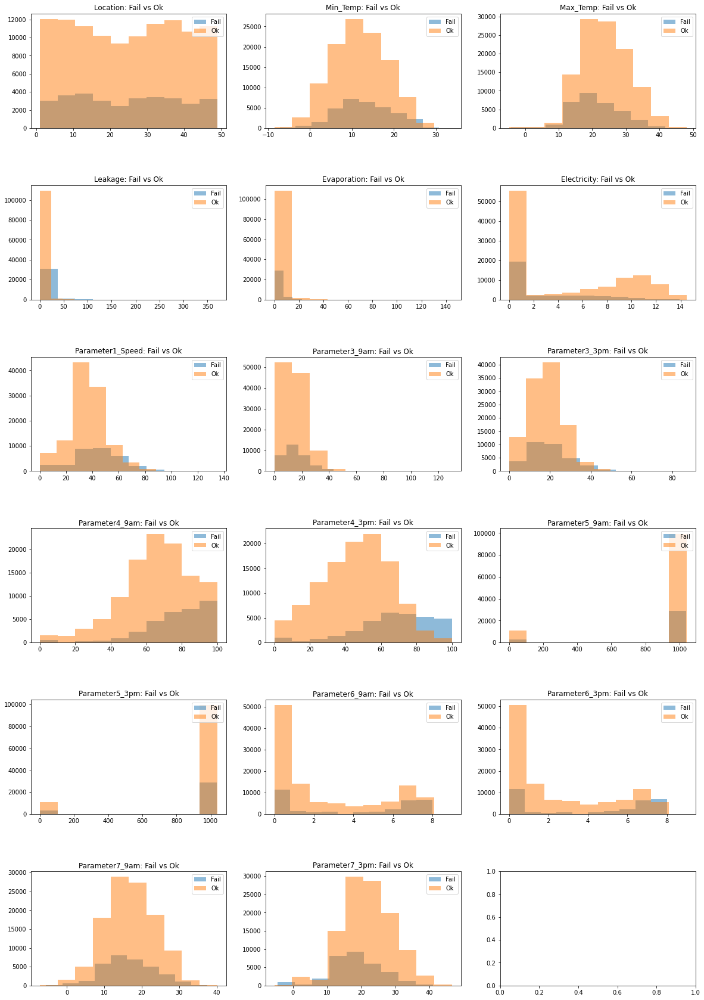

In [10]:
# Function for plotting feature distributions to compare 
def compare_features(features, df1, df2, labels, title, rows, cols, figx, figy):
    
    # Define constants
    bins = 10
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(figx, figy))
    fig.subplots_adjust(hspace=0.5)
    # For each axes & feature
    for index, (ax, feature) in enumerate(zip(axes.flatten(), features)):
        
        ax.hist(df1[feature], bins, alpha=0.5, label=labels[0])
        ax.hist(df2[feature], bins, alpha=0.5, label=labels[1])
        ax.legend(loc='upper right')
        ax.set_title(feature + title)        

# Get feature names (remove last element target feature)
features = df.columns
features = features[:-1]
# Plot feature distributions to compare sub-groups
compare_features(features, fail_df, nofail_df, ['Fail', 'Ok'], ": Fail vs Ok", 6, 3, 20, 30)

### 4.2 Multivariate analysis
#### 4.2.1 Correlation plot

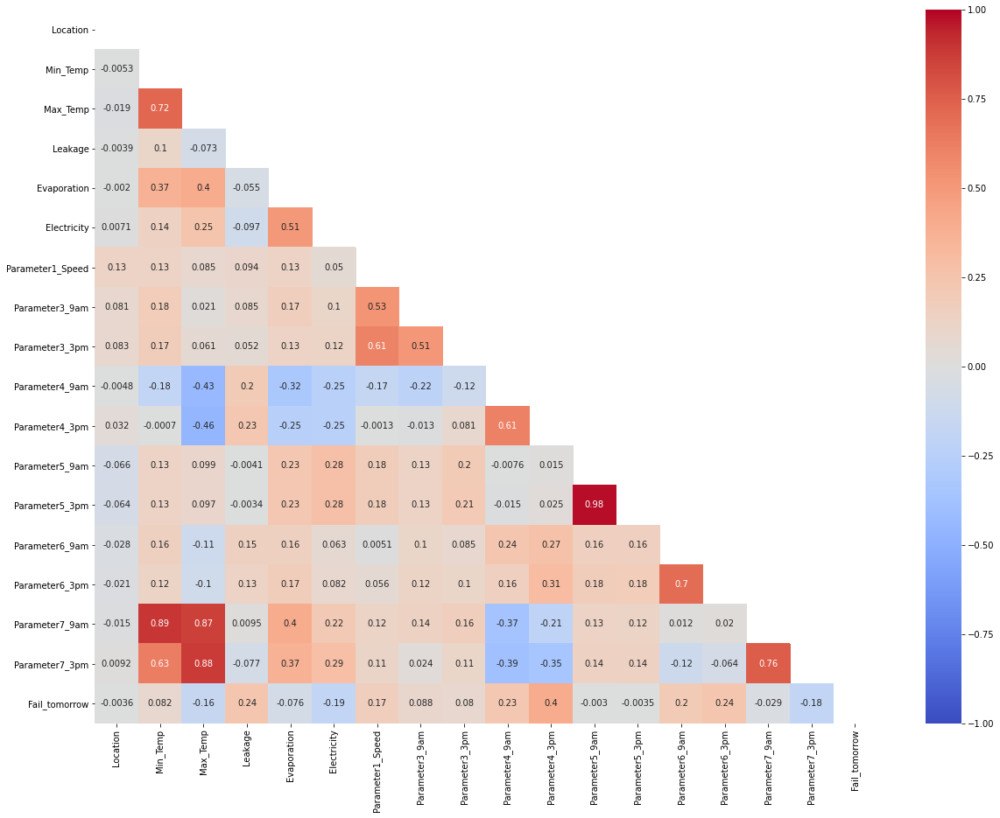

In [11]:
# Plot cross correlation of all features
plt.subplots(figsize=(20,15))
matrix = np.triu(df.corr())
sns.heatmap(df.corr(), annot = True, vmin=-1, vmax=1, center= 0, cmap= 'coolwarm',mask=matrix)

#### 4.2.2 Dimensionality reduction using PCA

In [12]:
# Extract first 3 principle components
pca = PCA(n_components=3)
pca_result = pca.fit_transform(df[features].values)
df['pca-one'] = pca_result[:,0]
df['pca-two'] = pca_result[:,1] 
df['pca-three'] = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

Explained variation per principal component: [0.98196318 0.00811792 0.00419208]


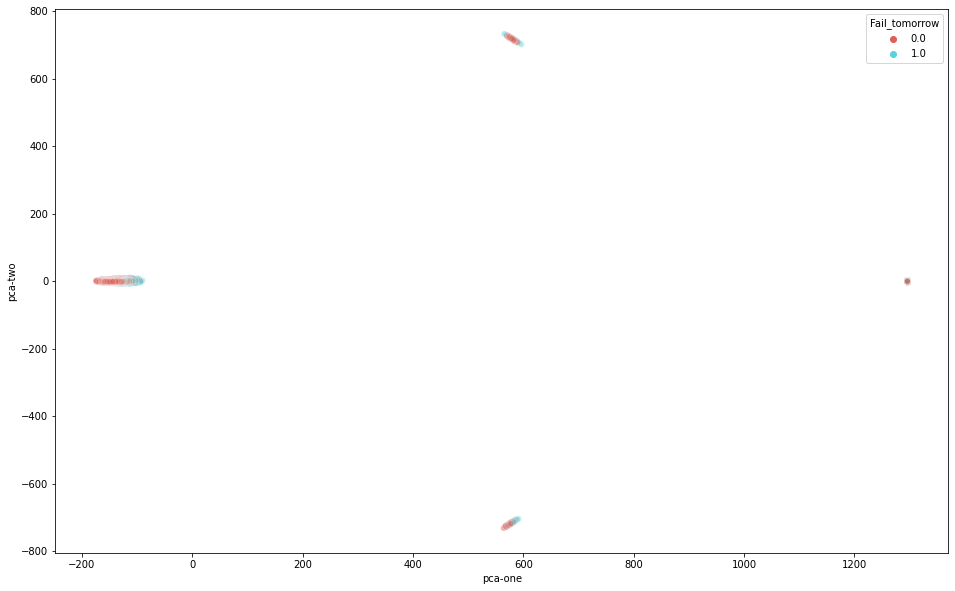

In [13]:
# Plot dataset with 2 PCA features, using same colour for data from each digit
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="Fail_tomorrow",
    palette=sns.color_palette("hls", 2),
    data=df,
    legend="full",
    alpha=0.3
)

In [14]:
df = df.drop(columns=['pca-one', 'pca-two','pca-three'])

#### 4.2.3 Dimensionality reduction using UMAP

In [15]:
# Separate feature columns
features_df = df.drop('Fail_tomorrow', 1)

# Initialise 2D & 3D UMAP models
umap_2d = UMAP(n_components=2, init='random', random_state=0)
umap_3d = UMAP(n_components=3, init='random', random_state=0)

# Fit 2D & 3D UMAP models to our data
proj_2d = umap_2d.fit_transform(features_df)
proj_3d = umap_3d.fit_transform(features_df)

# Use plotly to plot our projections
fig_2d = px.scatter(
    proj_2d, x=0, y=1, 
    color=df['Fail_tomorrow'], labels={'color': 'Fail_tomorrow'}
)
fig_3d = px.scatter_3d(
    proj_3d, x=0, y=1, z=2,
    color=df['Fail_tomorrow'], labels={'color': 'Fail_tomorrow'}
)
# Configure projections
fig_3d.update_traces(marker_size=5)
# Hide axes colouring for 3D
fig_3d.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )
fig_2d.update_layout(
    autosize=False,
    width=800,
    height=800)
fig_3d.update_layout(
    autosize=False,
    width=800,
    height=800)
# Render projections
fig_2d.show()
fig_3d.show()

## 5 Predictive modelling
### 5.1 Split data into train and test sets

In [16]:
# Create 70/30 train/test sequential split
split = int((df.shape[0]/100) * 70)
train_df, test_df = df[:split], df[split+1:]
print(train_df.shape[0])
print(test_df.shape[0])

99535
42657


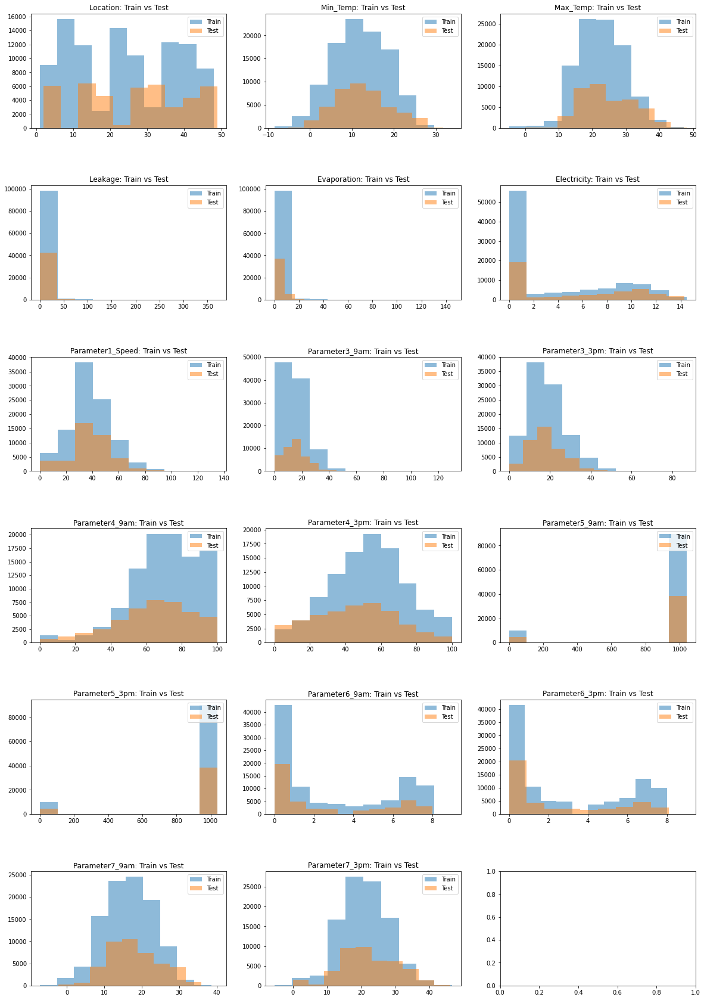

In [17]:
# Plot feature distributions to compare sub-groups
compare_features(features, train_df, test_df, ['Train', 'Test'], ": Train vs Test", 6, 3, 20, 30)

### 5.2 Define naive probabilsitic predictor

In [18]:
# estimate naive probabilistic forecast
naive = sum(train_df['Fail_tomorrow']) / train_df.shape[0]
print(naive)
# forecast the test dataset
yhat = [naive for _ in range(test_df.shape[0])]
# evaluate forecast
testy = test_df['Fail_tomorrow']
bs = brier_score_loss(testy, yhat)
print('Brier Score: %.6f' % bs)
# calculate brier skill score
bs_ref = bs
bss = (bs - bs_ref) / (0 - bs_ref)
print('Brier Skill Score: %.6f' % bss)

0.23179786004922892
Brier Score: 0.164452
Brier Skill Score: -0.000000


### 5.3 Test and evaluate probabilistic predictive models

In [19]:
# evaluate a sklearn model
def evaluate_once(bs_ref, template, trainX, trainy, testX, testy):
	# fit model
	model = clone(template)
	model.fit(trainX, trainy.values.ravel())
	# predict probabilities for 0 and 1
	probs = model.predict_proba(testX)
	# keep the probabilities for class=1 only
	yhat = probs[:, 1]
	# calculate brier score
	bs = brier_score_loss(testy, yhat)
	# calculate brier skill score
	bss = (bs - bs_ref) / (0 - bs_ref)
	return bss
 
# evaluate an sklearn model n times
def evaluate(bs_ref, model, trainX, trainy, testX, testy, n=10):
	scores = [evaluate_once(bs_ref, model, trainX, trainy, testX, testy) for _ in range(n)]
	print('>%s, bss=%.6f' % (type(model), mean(scores)))
	return scores
 
# split into inputs/outputs
trainX = train_df.iloc[:, :-1]
trainy = train_df.iloc[:,-1:]
testX = test_df.iloc[:, :-1]
testy = test_df.iloc[:,-1:]
print(trainX.shape)
print(trainy.shape)
print(testX.shape)
print(testy.shape)

(99535, 17)
(99535, 1)
(42657, 17)
(42657, 1)


><class 'sklearn.ensemble._bagging.BaggingClassifier'>, bss=0.323446
><class 'sklearn.ensemble._forest.ExtraTreesClassifier'>, bss=0.344228
><class 'sklearn.ensemble._gb.GradientBoostingClassifier'>, bss=0.377278
><class 'sklearn.ensemble._forest.RandomForestClassifier'>, bss=0.350401


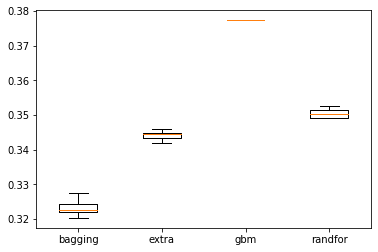

In [20]:
# calculate naive bs
bs_ref = brier_score_loss(testy, yhat)
# evaluate a suite of ensemble tree methods
scores, names = list(), list()
n_trees=100
# bagging
model = BaggingClassifier(n_estimators=n_trees)
avg_bss = evaluate(bs_ref, model, trainX, trainy, testX, testy)
scores.append(avg_bss)
names.append('bagging')
# extra
model = ExtraTreesClassifier(n_estimators=n_trees)
avg_bss = evaluate(bs_ref, model, trainX, trainy, testX, testy)
scores.append(avg_bss)
names.append('extra')
# gbm
model = GradientBoostingClassifier(n_estimators=n_trees)
avg_bss = evaluate(bs_ref, model, trainX, trainy, testX, testy)
scores.append(avg_bss)
names.append('gbm')
# rf
model = RandomForestClassifier(n_estimators=n_trees)
avg_bss = evaluate(bs_ref, model, trainX, trainy, testX, testy)
scores.append(avg_bss)
names.append('randfor')
# plot results
pyplot.boxplot(scores, labels=names)
pyplot.show()

In [21]:
# Create best model
best_model = GradientBoostingClassifier(n_estimators=n_trees)
best_model.fit(trainX, trainy.values.ravel())

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

### 5.4 Define naive class predictor

In [22]:
# Calculate accuracy, precision and recall
accuracy = sum(train_df['Fail_tomorrow']) / train_df.shape[0]
recall = 1
precision = accuracy

# Calculate F-score using the formula above for beta = 0.5 and correct values for precision and recall.
beta_squared = 0.5 * 0.5
fscore = (1 + beta_squared) * ((precision * recall) / ((beta_squared * precision) + recall))

# Print the results 
print("Naive Predictor: [Accuracy score: {:.4f}, F-score: {:.4f}]".format(accuracy, fscore))

Naive Predictor: [Accuracy score: 0.2318, F-score: 0.2739]


### 5.5 Calculate Metrics for best model with default threshold

In [23]:
# predict class values
yhat = best_model.predict(testX)
lr_f1 = f1_score(testy, yhat)
# summarize scores
print('Best model F1: f1=%.3f ' % lr_f1,)

Best model F1: f1=0.573 


### 5.6 Find optimal threshold value for classes

### 5.7 Test and evaluate class predictive models with custom threshold

### 5.8 Explore feature importances of best model

In [24]:
def feature_plot(importances, X_train, y_train):

    # Display the five most important features
    indices = np.argsort(importances)[::-1]
    columns = X_train.columns.values[indices[:5]]
    values = importances[indices][:5]

    # Creat the plot
    fig = plt.figure(figsize = (9,5))
    plt.title("Normalized Weights for First Five Most Predictive Features", fontsize = 16)
    plt.bar(np.arange(5), values, width = 0.6, align="center", color = '#00A000', \
          label = "Feature Weight")
    plt.bar(np.arange(5) - 0.3, np.cumsum(values), width = 0.2, align = "center", color = '#00A0A0', \
          label = "Cumulative Feature Weight")
    plt.xticks(np.arange(5), columns)
    plt.xlim((-0.5, 4.5))
    plt.ylabel("Weight", fontsize = 12)
    plt.xlabel("Feature", fontsize = 12)

    plt.legend(loc = 'upper center')
    plt.tight_layout()
    plt.show()

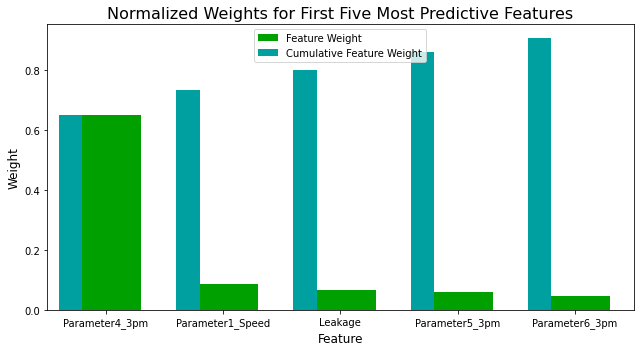

In [25]:
# Extract the feature importances 
importances = best_model.feature_importances_

# Plot
feature_plot(importances, trainX, trainy)

## 6 Conclusion